In [1]:
import torch
import torch.nn as nn
# from torch.nn import init
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd import Variable
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader
import torchvision.models as models
import torch.backends.cudnn as cudnn
import torchvision
import torch.autograd as autograd
from PIL import Image
import imp
import os
import sys
import math
import time
import random
import shutil
# import cv2
import scipy.misc
from glob import glob
import sklearn
import logging

from time import time
from tqdm import tqdm
import numpy as np
import matplotlib as mpl
mpl.use('Agg')
import matplotlib.pyplot as plt
plt.style.use('bmh')

%matplotlib inline

In [2]:
if not torch.cuda.is_available():
    print("SORRY: No CUDA device")

In [3]:
imageSize = 64
batchSize = 64

In [4]:
nz = 100
ngf = 64
ndf = 64
nc = 3

nd = 1
cuda = True

### Load data

In [5]:
PATH = 'celeba/'

data = dset.ImageFolder(PATH,
    transforms.Compose([
        transforms.Scale(imageSize),
        transforms.CenterCrop(imageSize),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ])
)

dataloader = DataLoader(data, batch_size=batchSize, shuffle=True)

### Custom weights initialization called on netG and netD

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [7]:
class _netG(nn.Module):
    def __init__(self):
        super(_netG, self).__init__()
        self.ngpu = 1
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(     nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2,     ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(    ngf,      nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        if isinstance(input.data, torch.cuda.FloatTensor) and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, input, range(self.ngpu))
        else:
            output = self.main(input)
        return output
    
netG = _netG()
netG.apply(weights_init)
netG

_netG (
  (main): Sequential (
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True)
    (2): ReLU (inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
    (5): ReLU (inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
    (8): ReLU (inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True)
    (11): ReLU (inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh ()
  )
)

In [8]:
class _netD(nn.Module):
    def __init__(self):
        super(_netD, self).__init__()
        self.ngpu = 1        
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        if isinstance(input.data, torch.cuda.FloatTensor) and self.ngpu > 1:
            output = nn.parallel.data_parallel(self.main, input, range(self.ngpu))
        else:
            output = self.main(input)
        
        return output
        return output.view(-1, 1)

netDs = [_netD() for _ in range(nd)]
[netD.apply(weights_init) for netD in netDs]

[_netD (
   (main): Sequential (
     (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
     (1): LeakyReLU (0.2, inplace)
     (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
     (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True)
     (4): LeakyReLU (0.2, inplace)
     (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
     (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True)
     (7): LeakyReLU (0.2, inplace)
     (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
     (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True)
     (10): LeakyReLU (0.2, inplace)
     (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
     (12): Sigmoid ()
   )
 )]

### Setup input and output tensors

In [9]:
criterion = nn.BCELoss()

input = torch.FloatTensor(batchSize, 3, imageSize, imageSize)
noise = torch.FloatTensor(batchSize, nz, 1, 1)
fixed_noise = torch.FloatTensor(batchSize, nz, 1, 1).normal_(0, 1)
label = torch.FloatTensor(batchSize)
real_label = 1
fake_label = 0

if cuda:
    [netD.cuda() for netD in netDs]
    netG.cuda()
    criterion.cuda()
    input, label = input.cuda(), label.cuda()
    noise, fixed_noise = noise.cuda(), fixed_noise.cuda()

input = Variable(input)
label = Variable(label)
noise = Variable(noise)
fixed_noise = Variable(fixed_noise)

### Setup optimizer

In [10]:
lr = 0.0002
beta1 = 0.5

In [11]:
optimizerDs = [optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999)) for netD in netDs]
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## Train

In [13]:
niter = 10

[0/10][0/3166][0.77] Loss_D: 1.57 Loss_G: 5.62 D(x): 0.59 D(G(z)): 0.55 / 0.00


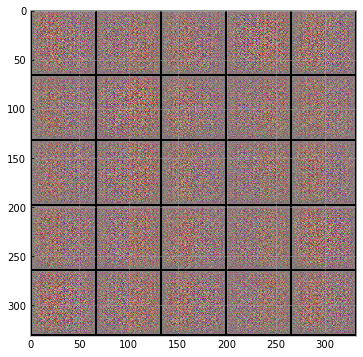

[0/10][1000/3166][285.09] Loss_D: 0.71 Loss_G: 4.68 D(x): 0.63 D(G(z)): 0.01 / 0.02


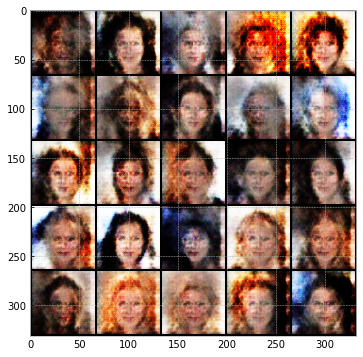

[0/10][2000/3166][570.61] Loss_D: 0.58 Loss_G: 2.44 D(x): 0.70 D(G(z)): 0.11 / 0.13


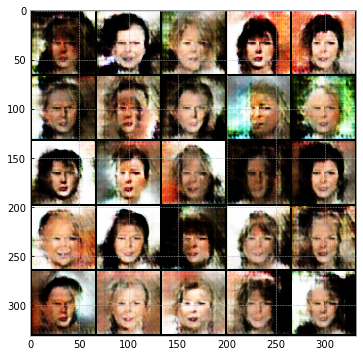

[0/10][3000/3166][855.96] Loss_D: 0.41 Loss_G: 4.27 D(x): 0.91 D(G(z)): 0.25 / 0.02


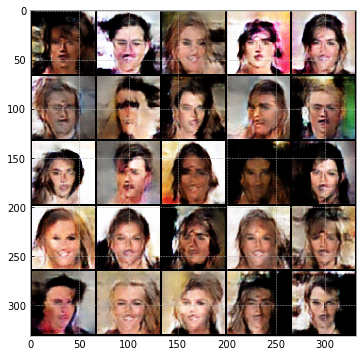

[1/10][0/3166][903.48] Loss_D: 0.37 Loss_G: 3.73 D(x): 0.93 D(G(z)): 0.23 / 0.03


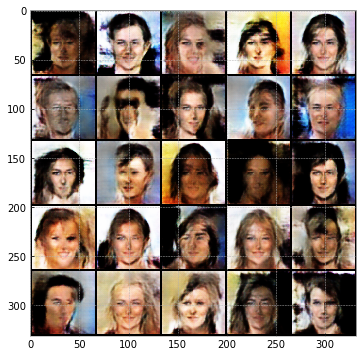

[1/10][1000/3166][1188.88] Loss_D: 0.63 Loss_G: 2.71 D(x): 0.80 D(G(z)): 0.27 / 0.10


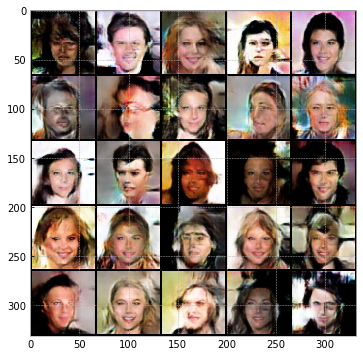

[1/10][2000/3166][1473.74] Loss_D: 0.72 Loss_G: 1.85 D(x): 0.71 D(G(z)): 0.24 / 0.19


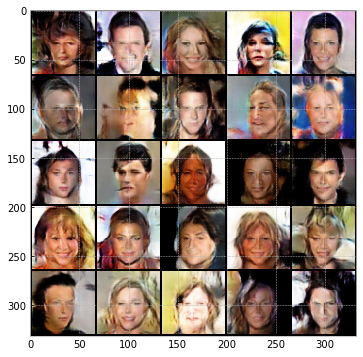

[1/10][3000/3166][1758.82] Loss_D: 1.46 Loss_G: 4.98 D(x): 0.97 D(G(z)): 0.70 / 0.01


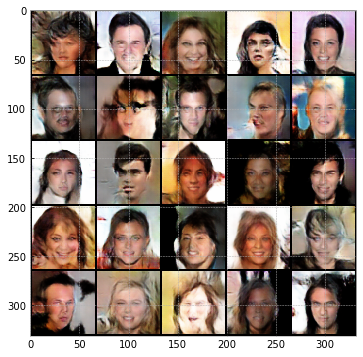

[2/10][0/3166][1806.28] Loss_D: 0.81 Loss_G: 1.45 D(x): 0.55 D(G(z)): 0.07 / 0.28


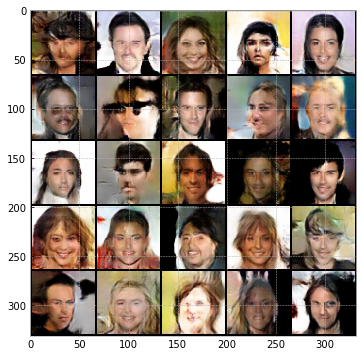

[2/10][1000/3166][2090.85] Loss_D: 0.51 Loss_G: 2.69 D(x): 0.77 D(G(z)): 0.18 / 0.08


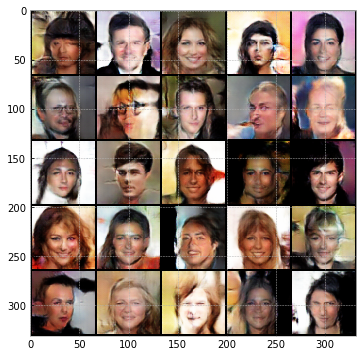

[2/10][2000/3166][2375.37] Loss_D: 0.71 Loss_G: 1.54 D(x): 0.59 D(G(z)): 0.08 / 0.27


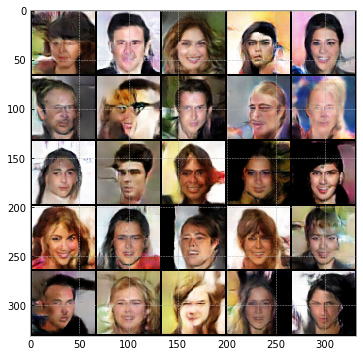

[2/10][3000/3166][2659.87] Loss_D: 0.74 Loss_G: 3.54 D(x): 0.83 D(G(z)): 0.36 / 0.04


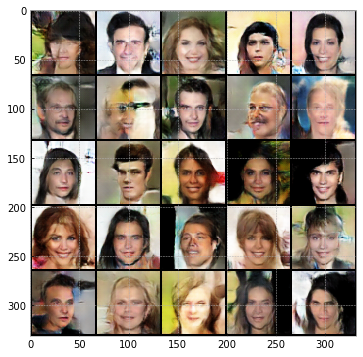

[3/10][0/3166][2707.30] Loss_D: 0.31 Loss_G: 3.24 D(x): 0.85 D(G(z)): 0.12 / 0.06


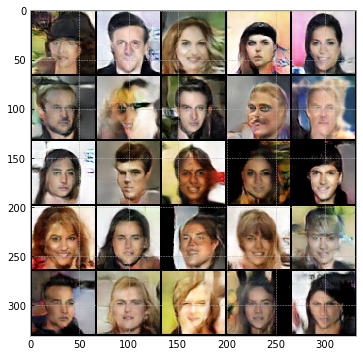

[3/10][1000/3166][2991.80] Loss_D: 0.41 Loss_G: 3.13 D(x): 0.73 D(G(z)): 0.04 / 0.08


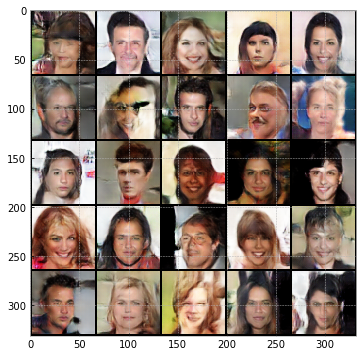

[3/10][2000/3166][3276.34] Loss_D: 0.33 Loss_G: 2.86 D(x): 0.83 D(G(z)): 0.12 / 0.08


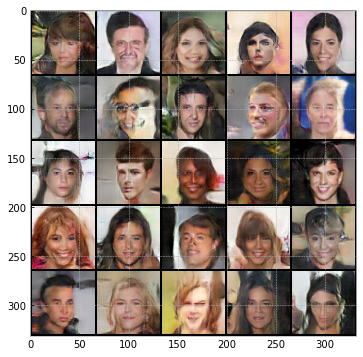

[3/10][3000/3166][3560.80] Loss_D: 0.39 Loss_G: 3.32 D(x): 0.86 D(G(z)): 0.18 / 0.05


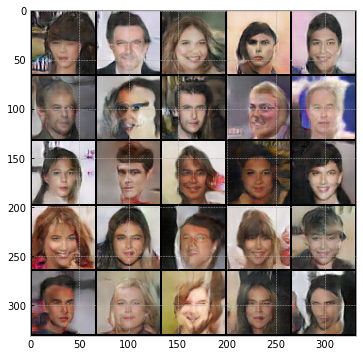

[4/10][0/3166][3608.25] Loss_D: 0.79 Loss_G: 2.63 D(x): 0.68 D(G(z)): 0.21 / 0.11


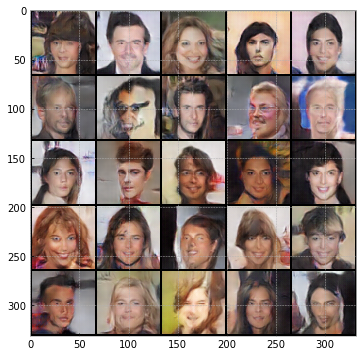

[4/10][1000/3166][3893.27] Loss_D: 0.53 Loss_G: 3.94 D(x): 0.88 D(G(z)): 0.28 / 0.03


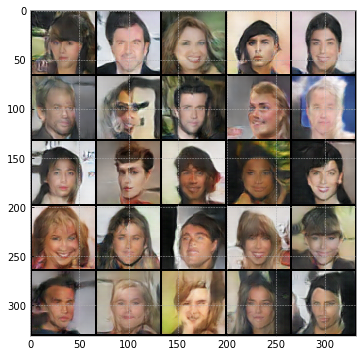

[4/10][2000/3166][4178.14] Loss_D: 0.25 Loss_G: 3.14 D(x): 0.84 D(G(z)): 0.06 / 0.06


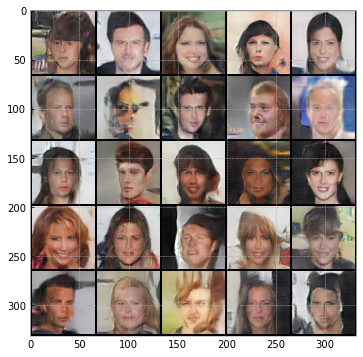

[4/10][3000/3166][4462.82] Loss_D: 0.29 Loss_G: 3.48 D(x): 0.86 D(G(z)): 0.10 / 0.04


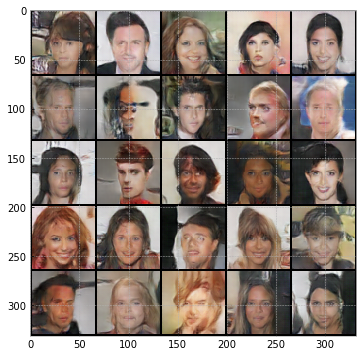

[5/10][0/3166][4510.35] Loss_D: 1.34 Loss_G: 6.19 D(x): 0.98 D(G(z)): 0.64 / 0.00


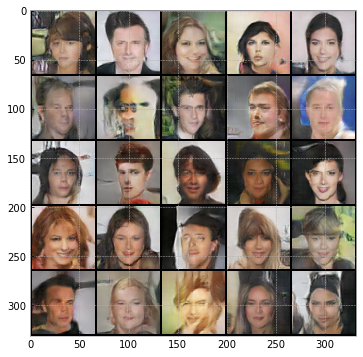

[5/10][1000/3166][4794.89] Loss_D: 0.34 Loss_G: 3.53 D(x): 0.95 D(G(z)): 0.22 / 0.04


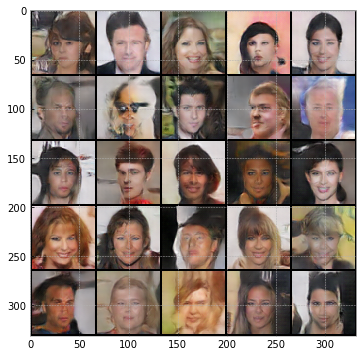

[5/10][2000/3166][5079.68] Loss_D: 1.10 Loss_G: 0.63 D(x): 0.43 D(G(z)): 0.01 / 0.62


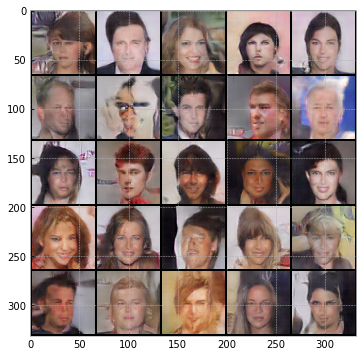

[5/10][3000/3166][5363.97] Loss_D: 0.83 Loss_G: 3.84 D(x): 0.75 D(G(z)): 0.28 / 0.04


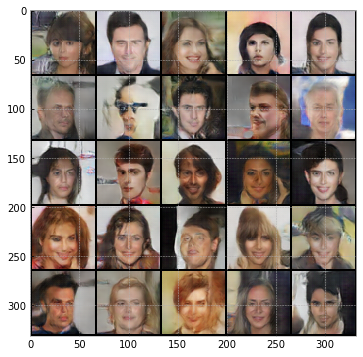

[6/10][0/3166][5411.34] Loss_D: 0.31 Loss_G: 3.96 D(x): 0.92 D(G(z)): 0.18 / 0.03


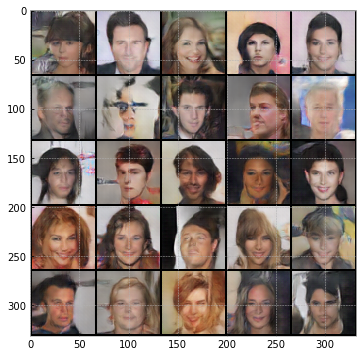

[6/10][1000/3166][5695.68] Loss_D: 0.60 Loss_G: 2.37 D(x): 0.61 D(G(z)): 0.01 / 0.16


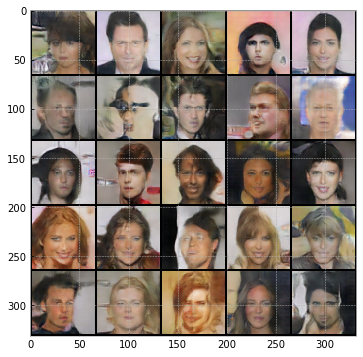

[6/10][2000/3166][5979.95] Loss_D: 0.26 Loss_G: 4.25 D(x): 0.91 D(G(z)): 0.14 / 0.02


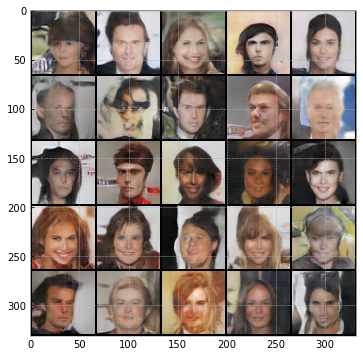

[6/10][3000/3166][6264.09] Loss_D: 0.17 Loss_G: 4.16 D(x): 0.95 D(G(z)): 0.10 / 0.03


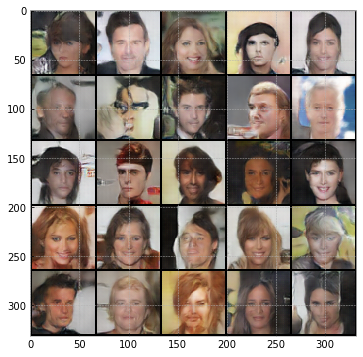

[7/10][0/3166][6311.53] Loss_D: 0.22 Loss_G: 5.29 D(x): 0.94 D(G(z)): 0.13 / 0.01


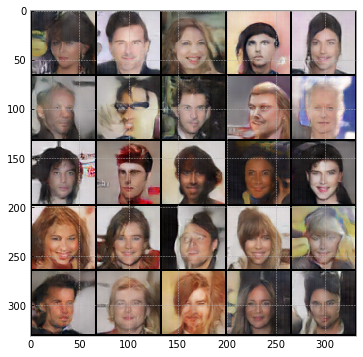

[7/10][1000/3166][6596.24] Loss_D: 0.57 Loss_G: 6.30 D(x): 0.93 D(G(z)): 0.34 / 0.00


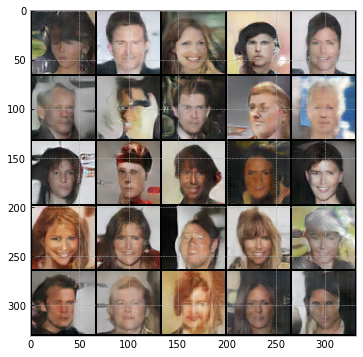

[7/10][2000/3166][6880.56] Loss_D: 1.32 Loss_G: 2.94 D(x): 0.76 D(G(z)): 0.51 / 0.11


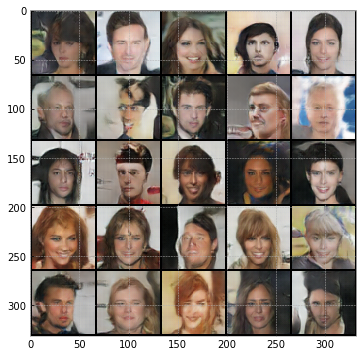

[7/10][3000/3166][7165.63] Loss_D: 5.75 Loss_G: 8.22 D(x): 1.00 D(G(z)): 0.96 / 0.00


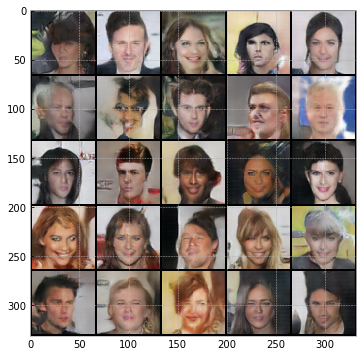

[8/10][0/3166][7213.07] Loss_D: 0.12 Loss_G: 4.01 D(x): 0.95 D(G(z)): 0.06 / 0.03


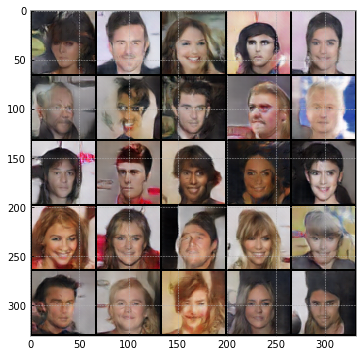

In [ ]:
tick = time()
losses = []
for epoch in range(niter):
    for i, data in enumerate(dataloader):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        
        for netD, optimizerD in zip(netDs, optimizerDs):
            netD.zero_grad()
            real_cpu, _ = data
            batch_size = real_cpu.size(0)
            input.data.resize_(real_cpu.size()).copy_(real_cpu)
            label.data.resize_(batch_size).fill_(real_label)

            output = netD(input)
            errD_real = criterion(output, label)
            errD_real.backward()
            D_x = output.data.mean()

            # train with fake
            noise.data.resize_(batch_size, nz, 1, 1)
            noise.data.normal_(0, 1)
            fake = netG(noise)
            label.data.fill_(fake_label)
            output = netD(fake.detach())
            errD_fake = criterion(output, label)
            errD_fake.backward()
            D_G_z1 = output.data.mean()
            errD = errD_real + errD_fake
            
            optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        whichD = np.random.randint(0, nd)
        netD = netDs[whichD]
        
        netG.zero_grad()
        label.data.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.data.mean()
        optimizerG.step()
        
        losses.append((errD.data[0], errG.data[0]))
        
        if i%1000 == 0:
            print('[{}/{}][{}/{}][{:.2f}] Loss_D: {:.2f} Loss_G: {:.2f} D(x): {:.2f} D(G(z)): {:.2f} / {:.2f}'.\
            format(epoch, niter, i, len(dataloader), time() - tick, errD.data[0], errG.data[0], D_x, D_G_z1, D_G_z2))
        
        if i%1000 == 0:
            fake = netG(fixed_noise).data
            show(vutils.make_grid(fake[:25], normalize=True, nrow=5).cpu())            
            #show(vutils.make_grid(fake, normalize=True).cpu())

### Show

In [14]:
def show(img, fs=(6,6)):
    plt.figure(figsize = fs)
    plt.imshow(np.transpose(img.numpy(), (1,2,0)))
    plt.show()

In [17]:
fake = netG(fixed_noise).data

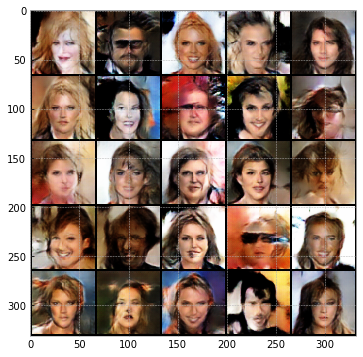

In [18]:
show(vutils.make_grid(fake[:25], normalize=True, nrow=5).cpu())